In [11]:
import re
import datetime

# 최대 줄 수 설정
pd.set_option('display.max_rows', 500)
# 최대 열 수 설정
pd.set_option('display.max_columns', 500)
# 표시할 가로의 길이
pd.set_option('display.width', 1000)

In [12]:
# google_df = pd.read_excel('./구글플레이스토어_2020_10_25_17_29.xlsx', index_col = 'index')
# print(google_df.shape)


In [13]:
# google_df = google_df.drop_duplicates(subset = ['reviewer', 'review_date', 'review', 'star_point', 'like'], keep = 'first')
# google_df = google_df.reset_index(drop = True)
# google_df['source'] = 'playstore'
# google_df['star_point'] = google_df['star_point'].str.replace('별표 5개 만점에 ', '').str.replace('개를 받았습니다.', '').astype(int)
# google_df['review_date'] = pd.to_datetime(google_df['review_date'], format="%Y년 %m월 %d일")

# print(google_df.shape)
# google_df

In [14]:
# app_df = pd.read_excel('./앱스토어_2020_10_22_08_38.xlsx', index_col = 'index')
# print(app_df.shape)
# app_df.head()

In [15]:
# app_df = app_df.drop_duplicates(subset = ['reviewer', 'review_date', 'review', 'star_point'], keep = 'first')
# app_df= app_df.reset_index(drop = True)
# app_df['like'] = np.nan
# app_df['source'] = 'appstore'
# app_df['star_point'] = app_df['star_point'].str.replace('/5', '').astype(int)
# app_df['review_date'] = pd.to_datetime(app_df['review_date'], format="%Y년 %m월 %d일")
# app_df['review'] = app_df['title'] + ' ' + app_df['review']
# app_df = app_df.drop('title', axis = 'columns')
# print(app_df.shape)
# app_df.head()

In [16]:
# data = pd.concat([google_df, app_df]).reset_index(drop = True)
# print(data.shape)
# data.head()

In [17]:
# dt = datetime.datetime.now()
# filename = ('통합_') + dt.strftime("%Y_%m_%d_%H_%M") +'.xlsx'
# data.to_excel('./Reviews/' + filename)

In [18]:
# data = pd.read_excel('./Reviews/통합_2020_10_27_12_01.xlsx')
# print(data.shape)
# data.head()

In [4]:
data = pd.read_excel('C:/Users/hp/Desktop/Reviews/형태소분석_2020_10_27_14_22.xlsx')
print(data.shape)
# data.head()

(10060, 14)


<AxesSubplot:xlabel='review_date_year', ylabel='count'>

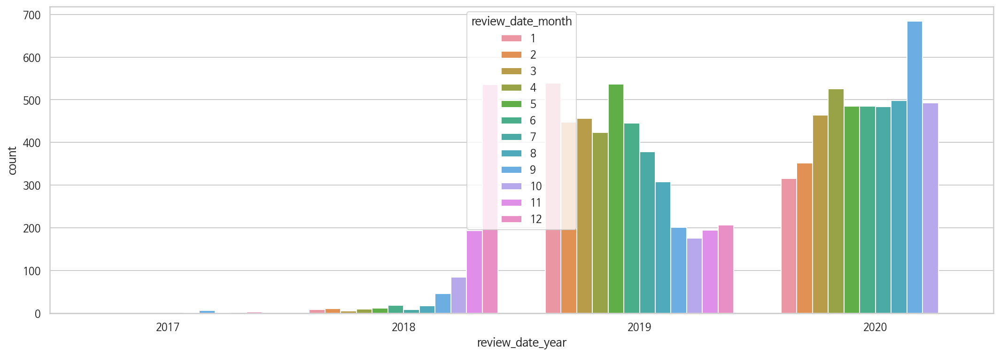

In [7]:
import matplotlib
import seaborn as sns
from IPython.display import set_matplotlib_formats
import matplotlib.pyplot as plt
set_matplotlib_formats('retina')

%matplotlib inline


plt.figure(figsize = (18, 6))

sns.countplot(data=data, x='review_date_year', hue = 'review_date_month')



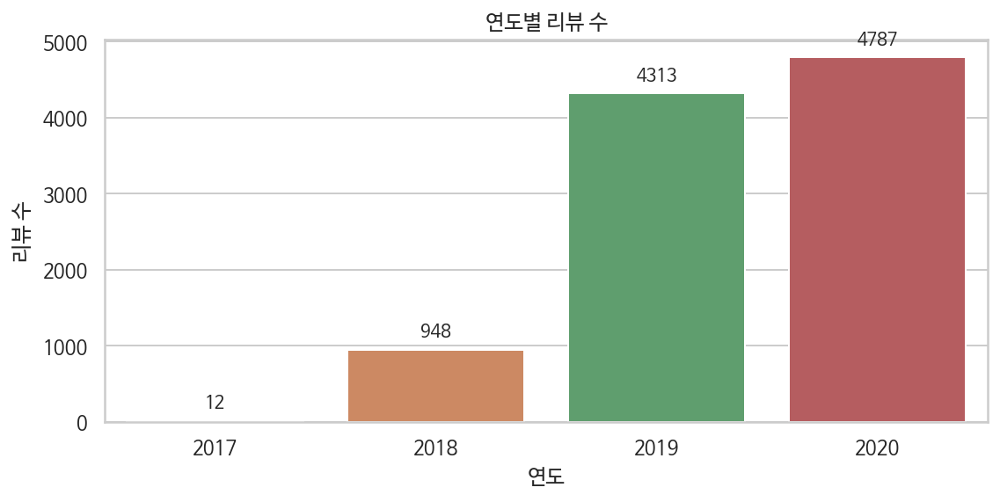

In [9]:
plt.figure(figsize = (9, 4))
ax = sns.countplot(data=data, x='review_date_year')
ax.set_title('연도별 리뷰 수')
ax.set_xlabel('연도')
ax.set_ylabel('리뷰 수')
for p in ax.patches:
    ax.annotate(format(p.get_height(), ''), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

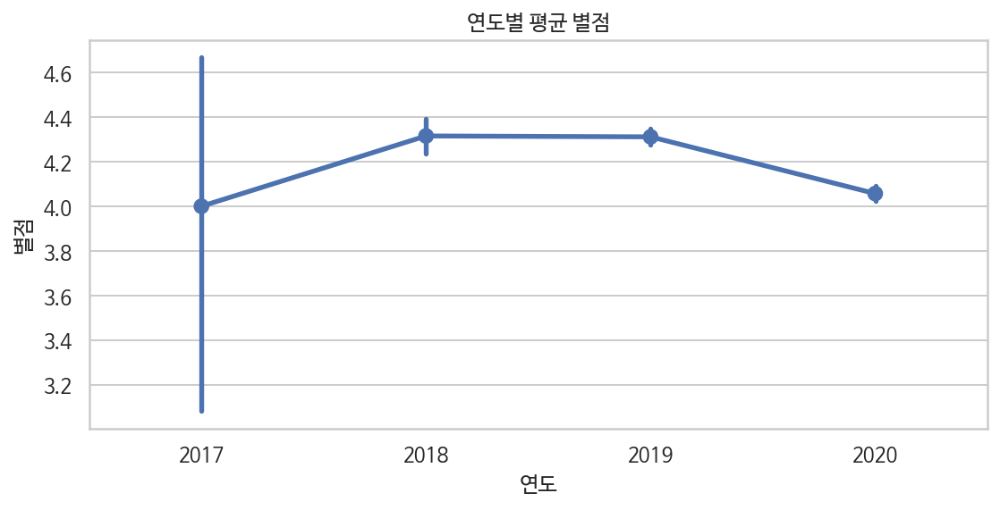

In [10]:
plt.figure(figsize = (9, 4))

ax = sns.pointplot(data=data, x='review_date_year',y='star_point')
ax.set_title('연도별 평균 별점')
ax.set_xlabel('연도')
ax.set_ylabel('별점')

plt.show()

In [11]:
data.rename(columns = {'star_point' : '평점'}, inplace = True)


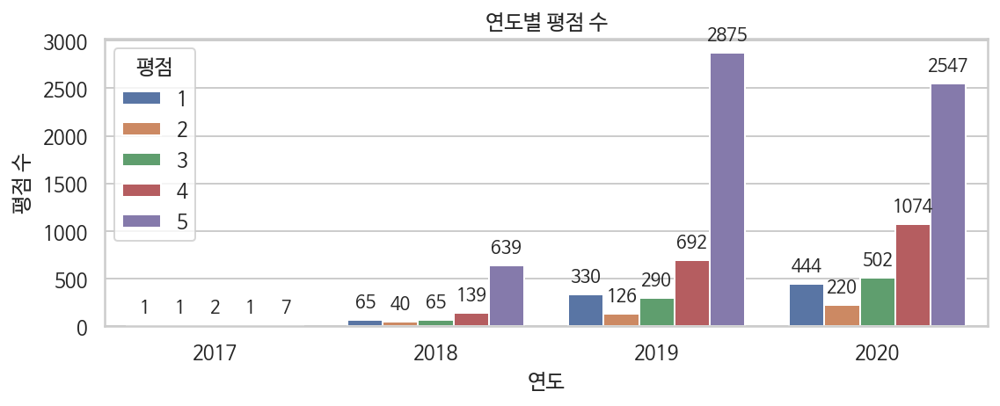

In [12]:
plt.figure(figsize = (9, 3))

ax = sns.countplot(data=data, x='review_date_year', hue = '평점')
ax.set_title('연도별 평점 수')
ax.set_xlabel('연도')
ax.set_ylabel('평점 수')
for p in ax.patches:
    ax.annotate(format(p.get_height(), ''), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
    
plt.show()

### 1. 빈도분석

In [13]:
from konlpy.tag import Komoran
komoran = Komoran()
print(komoran.pos('친척들이 모인 이번 추석 차례상에서는 단연 "집값"이 화제에 올랐다.'))

[('친척', 'NNG'), ('들', 'XSN'), ('이', 'JKS'), ('모이', 'VV'), ('ㄴ', 'ETM'), ('이번', 'NNG'), ('추석', 'NNP'), ('차례', 'NNG'), ('상', 'XSN'), ('에서', 'JKB'), ('는', 'JX'), ('단연', 'MAG'), ('"', 'SS'), ('집값', 'NNG'), ('"', 'SS'), ('이', 'MM'), ('화제', 'NNG'), ('에', 'JKB'), ('오르', 'VV'), ('았', 'EP'), ('다', 'EF'), ('.', 'SF')]


In [14]:
print(komoran.nouns('친척들이 모인 이번 추석 차례상에서는 단연 "집값"이 화제에 올랐다.'))

['친척', '이번', '추석', '차례', '집값', '화제']


In [15]:
from konlpy.tag import Kkma
kkma = Kkma()
from konlpy.tag import Hannanum
hannanum = Hannanum()
from konlpy.tag import Twitter
twitter = Twitter()

In [16]:
print(twitter.pos('친척들이 모인 이번 추석 차례상에서는 단연 "집값"이 화제에 올랐다.'))

[('친척', 'Noun'), ('들', 'Suffix'), ('이', 'Josa'), ('모인', 'Verb'), ('이번', 'Noun'), ('추석', 'Noun'), ('차례상', 'Noun'), ('에서는', 'Josa'), ('단연', 'Noun'), ('"', 'Punctuation'), ('집값', 'Noun'), ('"', 'Punctuation'), ('이', 'Noun'), ('화제', 'Noun'), ('에', 'Josa'), ('올랐다', 'Verb'), ('.', 'Punctuation')]


In [17]:
#adj, noun, verb버전으로 다시

In [18]:
print(twitter.pos('예쁘다.'))

[('예쁘다', 'Adjective'), ('.', 'Punctuation')]


In [19]:
if twitter.pos('예쁘다.')[0][1] in ['Noun', 'Verb', 'Adjective']: #명사, 동사, 형용사만 추출
    print('yes')

yes


In [20]:
# def review_sub(x):
#     review = x['review']
    
#     review = re.sub('[^ A-Za-z가-힣]+', '', review) #한글만 추출하기
#     review = re.sub('([ㄱ-ㅎㅏ-ㅣ]+)', '', review) #한글만 추출하기
    
#     return review

# data['review_sub'] = data.apply(review_sub, axis = 'columns')

In [21]:
# def flatten_nouns(x):
#     global kkma
#     review = x['review_sub']
    
#     review_list = kkma.nouns(review)
    
#     return (',').join(review_list)

# data['review_flatten_nouns'] = data.apply(flatten_nouns, axis = 'columns')

In [22]:
# data = data.reset_index()
id_list = data['index'].tolist()

In [23]:
# #kkma
# from konlpy.tag import Kkma
# kkma = Kkma()

# for i in id_list :
#     review_list = []
#     review_list2 = []
#     review = data.loc[data['index'] == i]['review_sub'].tolist()[0]
#     if review != ' ':
#         review_list = kkma.pos(review)
#         for a in review_list :
#             if a[1] in ['NNG', 'NNP', 'NNB', 'NR', 'NP', 'NNM', 'VV', 'VA', 'VXV', 'VXA', 'VCP', 'VCN', 'UN', 'MAG']:  
#                 review_list2.append(a[0])
#                 data.loc[data['index'] == i, 'review_flatten_nouns(kkma)'] = (',').join(review_list2)
#             else:
#                 pass
#         print(i, ':', review_list2)   
        
#     else: 
#         pass

In [24]:
nouns_list = []
for i in id_list : 
    try:
        review_nouns_list = data.loc[data['index'] == i]['review_flatten_nouns(kkma)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            nouns_list.append(review_nouns_list[num])
    except :
        pass
    
print('완료')

완료


In [25]:
nouns_list = pd.Series([x for x in nouns_list if len(x)>= 1])
nouns_list.value_counts().head(30)

광고      507
프       497
좋       462
애       389
너무      384
다       354
진짜      316
정말      308
앱       191
잘       191
무료      188
저       119
이거      115
알       113
오       109
보       105
본인       97
일단       87
판권       85
업데이트     82
제가       81
완전       80
합법적      77
아주       74
최고       72
굿        63
하루       61
멤버십      59
월        59
안녕       58
dtype: int64

In [26]:
# #hannanum
# from konlpy.tag import Hannanum
# hannanum = Hannanum()
# for i in id_list :
#     review_list = []
#     review_list2 = []
#     review = data.loc[data['index'] == i]['review_sub'].tolist()[0]
#     if review != ' ':
#         review_list = hannanum.pos(review)
#         for a in review_list :
#             if a[1] in ['N', 'P', 'M']:  
#                 review_list2.append(a[0])
#                 data.loc[data['index'] == i, 'review_flatten_nouns(hannanum)'] = (',').join(review_list2)
#             else:
#                 pass
#         print(i, ':', review_list2)   
        
#     else: 
#         pass


In [27]:
nouns_list2 = []
for i in id_list : 
    try:
        review_nouns_list = data.loc[data['index'] == i]['review_flatten_nouns(hannanum)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            nouns_list2.append(review_nouns_list[num])
    except :
        pass
    
print('완료')

완료


In [28]:
nouns_list2 = pd.Series([x for x in nouns_list2 if len(x)>= 1])
nouns_list2.value_counts().head(30)

좋       341
광고      337
너무      312
진짜      302
다       269
정말      260
저       191
애       152
애니      126
무료      118
잘       108
이       106
이거       98
보        90
앱        88
본인인증     81
광고보고     79
오        77
합법적      73
최고       72
일단       71
완전       65
아주       64
판권       61
업데이트     61
하루       56
다좋은데     56
안녕       52
멤버십      50
굿        49
dtype: int64

In [29]:
# #twitter
# from konlpy.tag import Twitter
# twitter = Twitter()
# for i in id_list :
#     review_list = []
#     review_list2 = []
#     review = data.loc[data['index'] == i]['review_sub'].tolist()[0]
#     if review != ' ':
#         review_list = twitter.pos(review)
#         for a in review_list :
#             if a[1] in ['Noun', 'Verb', 'Adjective']:  
#                 review_list2.append(a[0])
#                 data.loc[data['index'] == i, 'review_flatten_nouns(twitter)'] = (',').join(review_list2)
#             else:
#                 pass
#         print(i, ':', review_list2)   
        
#     else: 
#         pass


In [30]:
nouns_list3 = []
for i in id_list : 
    try:
        review_nouns_list = data.loc[data['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            nouns_list3.append(review_nouns_list[num])
    except :
        pass
    
nouns_list3

['애니',
 '',
 '솔직히',
 '업데이트',
 '거',
 '하루',
 '',
 '더',
 '다운',
 '좋은',
 '맴버쉽',
 '잘',
 '와',
 '광고',
 '아니',
 '모든',
 '굉장히',
 '좋지만',
 '좋',
 '신규',
 '즐겨',
 '애니',
 '만화',
 '지나친',
 '음',
 '젠',
 '점도',
 '정말',
 '취지',
 '요즘',
 '많은',
 '사람',
 '정말',
 '와이파이',
 '하루',
 '앱',
 '여러',
 '안녕하세요',
 '좋은데',
 '애니맥스',
 '잘',
 '갓',
 '앱',
 '하루',
 '앱',
 '안녕하세요',
 '만족하면서',
 '다름',
 '좋은데',
 '오프닝',
 '애니',
 '좋지만',
 '앱내',
 '정말',
 '네트워크',
 '광고',
 '최근',
 '안녕하세요',
 '결재',
 '내',
 '무료',
 '좋',
 '하는것은',
 '보고',
 '',
 '공짜',
 '앱',
 '자신',
 '일단',
 '아녕',
 '거',
 '월',
 '랙',
 '편리함',
 '문의',
 '애니',
 '음제',
 '제',
 '',
 '애니',
 '괜찮은',
 '진짜',
 '일단',
 '재밌는',
 '애니메이션',
 '',
 '제',
 '인기',
 '제',
 '요즘',
 '들',
 '',
 '지인',
 '처음',
 '좋',
 '',
 '제',
 '첫',
 '이나',
 '가끔',
 '',
 '흐',
 '',
 '애매하다',
 '보관',
 '',
 '광고',
 '일단',
 '잘',
 '앞뒤',
 '좋아요',
 '애니',
 '갤럭시',
 '좋은데',
 '재밌어요',
 '다른건',
 '정말',
 '역시',
 '자꾸',
 '애니',
 '왠만한',
 '광고',
 '돈',
 '정말',
 '애니',
 '좋은데',
 '굳',
 '애니',
 '앱',
 '로',
 '정말',
 '전반',
 '애니',
 '애니',
 '인기',
 '보고싶으면',
 '안녕하세요',
 '좋은데',
 '월동',
 '광고',
 '최신',
 '감상',
 '거

In [31]:
nouns_list3 = pd.Series([x for x in nouns_list3 if len(x)>1])
nouns_list3.value_counts().head(30)

광고       507
좋아요      397
애니       364
좋은데      351
진짜       323
정말       294
무료       192
아니       113
합법       109
본인        98
판권        90
업데이트      83
완전        82
좋은        82
아주        74
일단        74
최고        70
하루        63
멤버십       60
안녕하세요     54
애니메이션     52
영상        48
좋습니다      46
좋긴        45
처음        43
다른        41
솔직히       41
결제        40
친구        39
멤버        39
dtype: int64

In [32]:
data.to_excel('C:/Users/hp/Desktop/test.xlsx')

In [33]:
#단어구름 형성하기

from wordcloud import WordCloud
from collections import Counter

font_path = 'C:/Windows/Fonts/NanumBarunGothic.ttf'
wordcloud = WordCloud(
    font_path = font_path,
    width = 800,
    height = 800,
    background_color = "white"
)

In [34]:
def __array__(self):
    """Convert to numpy array.
    Returns
    -------
    image : nd.array size(width, height, 3)
        Word cloud image as numpy matrix.
    """
    return self.to_array()
def to_array(self):
    """Convert to numpy array.
    Returns
    ------
    image : nd-array size(width, height, 3)
        Word cloud image as numpy matrix.
    """
    return np.array(self.to_image())

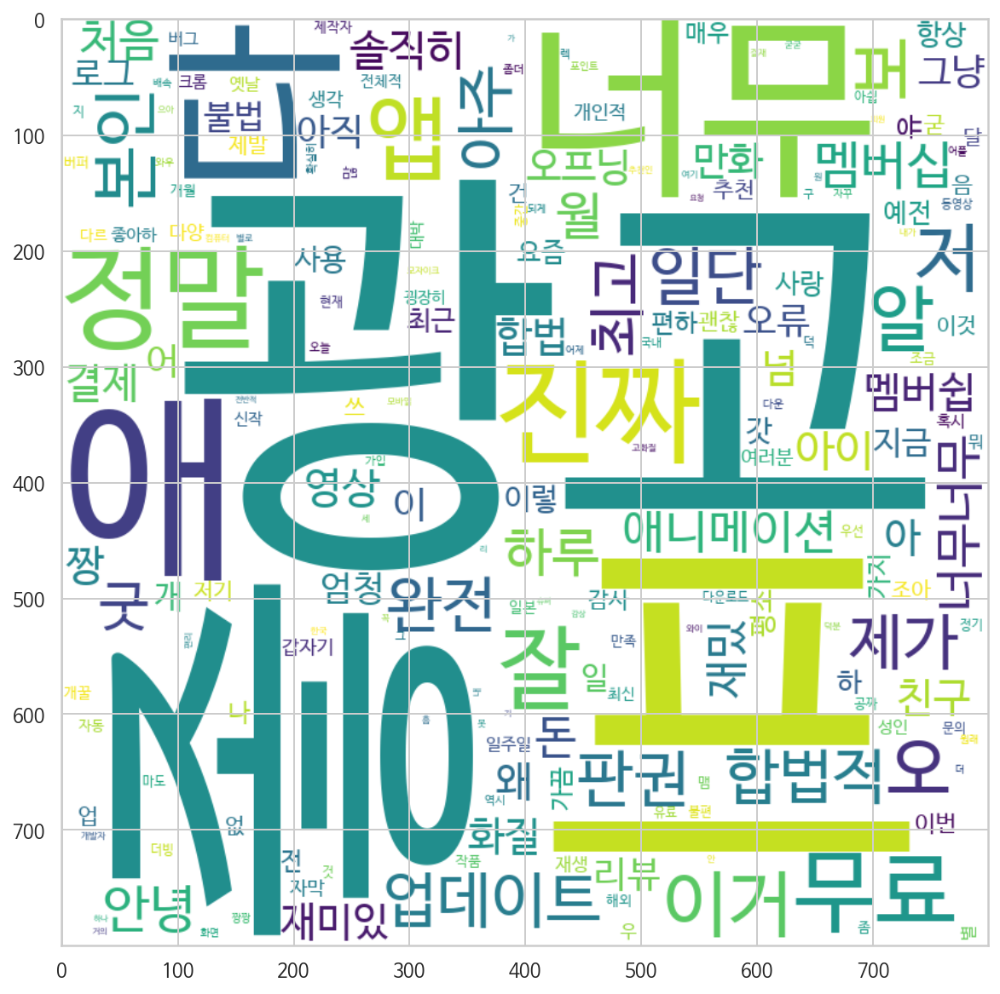

In [35]:
count = Counter(nouns_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_kkma.png')

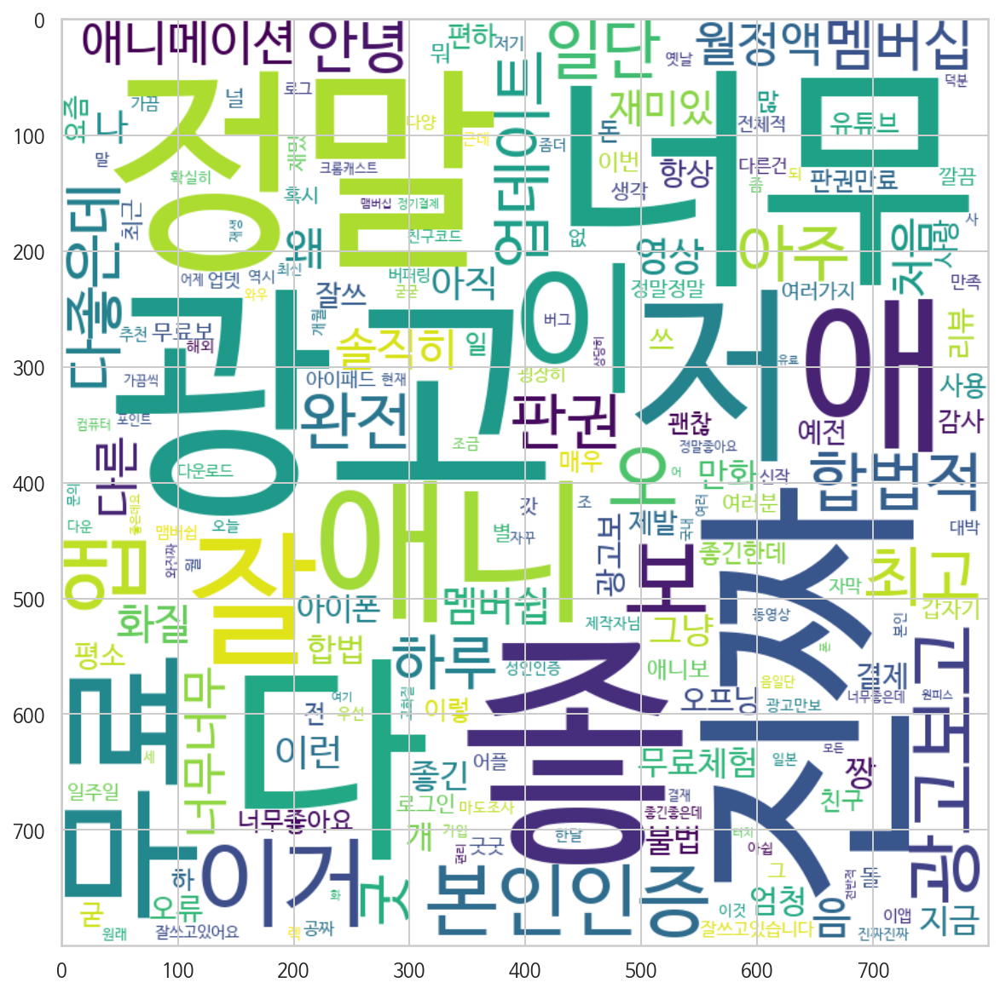

In [36]:
count = Counter(nouns_list2)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_hannanum.png')

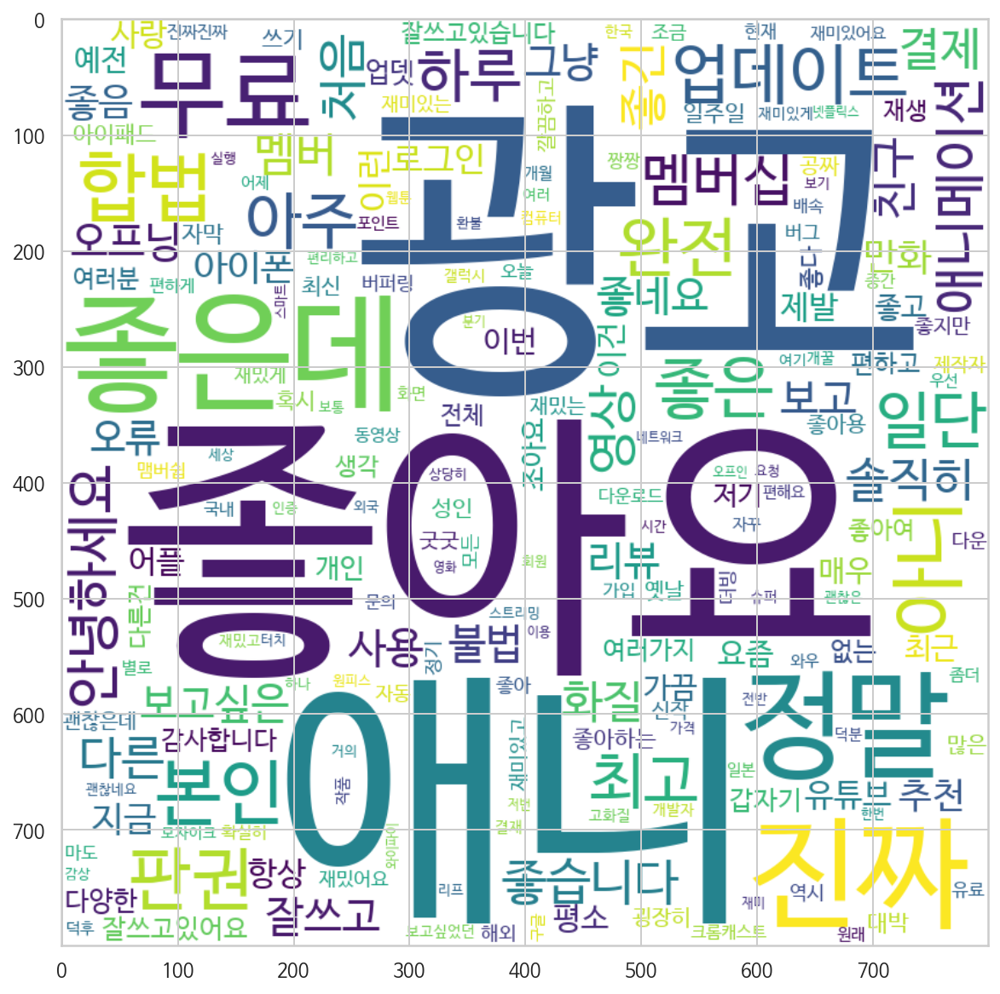

In [37]:
#형용사,동사 추가
count = Counter(nouns_list3)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_noun_adj_verb.png')

In [38]:
# dt = datetime.datetime.now()
# filename = ('형태소분석_') + dt.strftime("%Y_%m_%d_%H_%M") +'.xlsx'
# data.to_excel('./Reviews/' + filename)

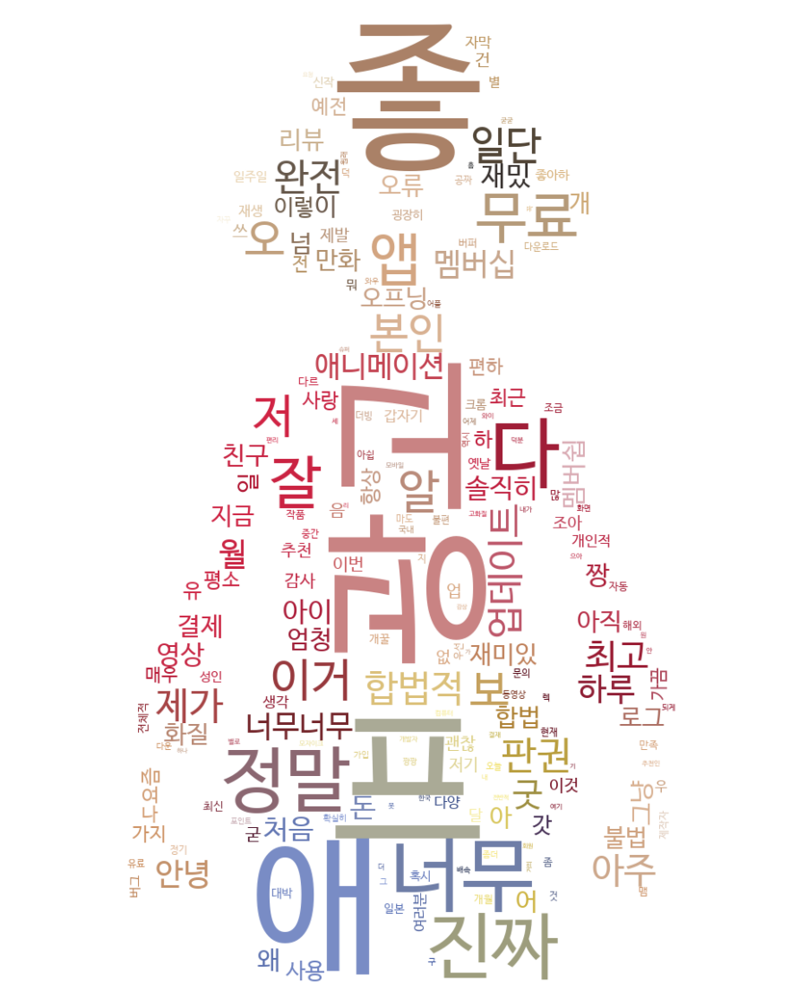

In [40]:
#kkma
from PIL import Image
from wordcloud import ImageColorGenerator 

luffy_mask = np.array(Image.open("C:/Users/hp/Desktop/luffy.jpg"))
image_colors = ImageColorGenerator(luffy_mask)

count = Counter(nouns_list)
wc_luffy = WordCloud(
    font_path = font_path,
    mask = luffy_mask,
    background_color = 'white'
)
wc_luffy = wc_luffy.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_luffy.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_kkma_luffy.png')

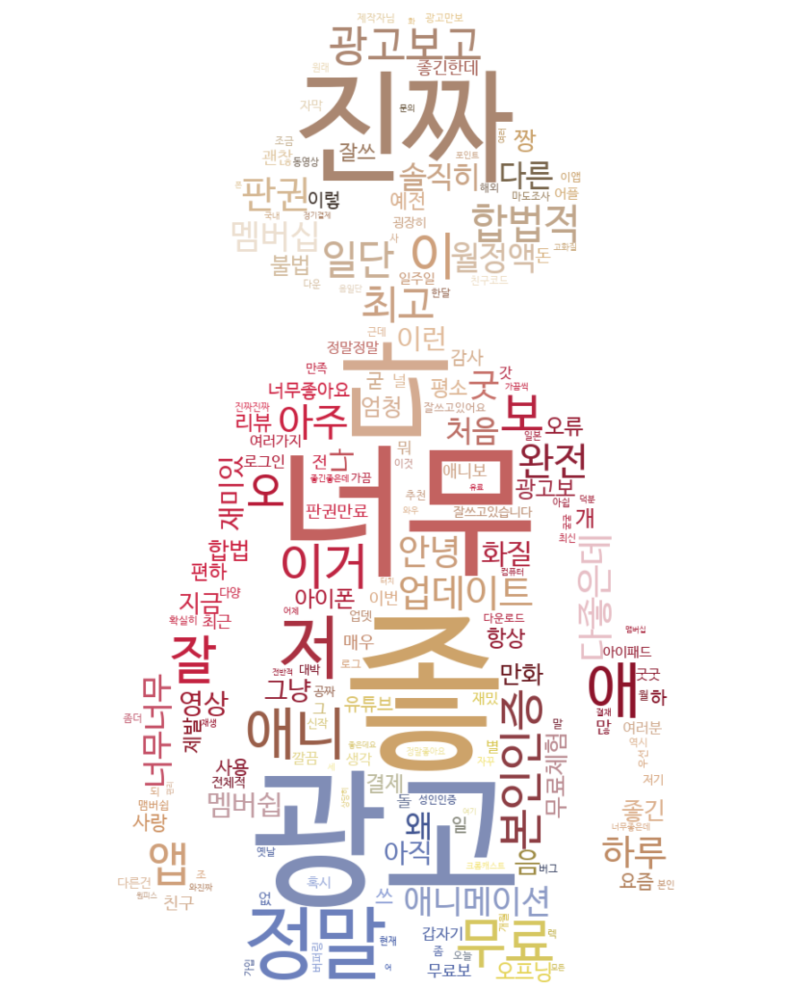

In [41]:
#hannanum
count = Counter(nouns_list2)
wc_luffy = WordCloud(
    font_path = font_path,
    mask = luffy_mask,
    background_color = 'white'
)
wc_luffy = wc_luffy.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_luffy.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_hannanum_luffy.png')

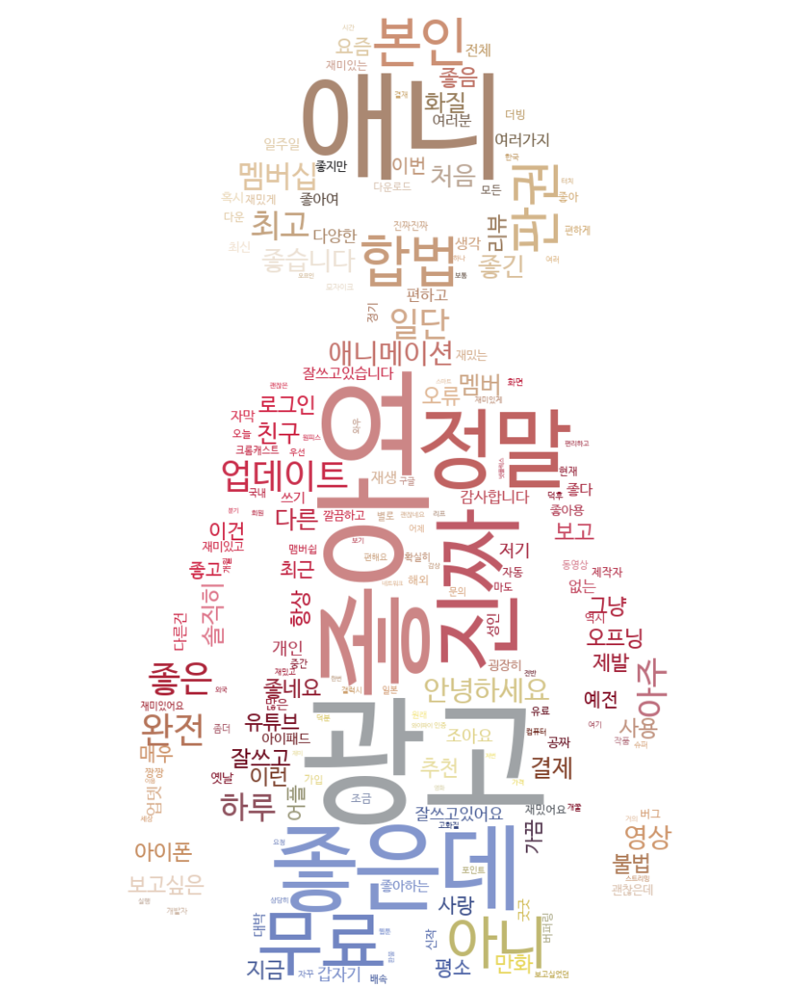

In [42]:
#twitter #형용사,동사추가
count = Counter(nouns_list3)
wc_luffy = WordCloud(
    font_path = font_path,
    mask = luffy_mask,
    background_color = 'white'
)
wc_luffy = wc_luffy.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_luffy.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_twitter_luffy_noun_adj_verb.png')

In [43]:
#연도별 단어빈도
data["review_date"] = pd.to_datetime(data["review_date"])
data["review_date_year"] = data["review_date"].dt.year
data["review_date_month"] = data["review_date"].dt.month
data["review_date_day"] = data["review_date"].dt.day



In [44]:
target = data.loc[data['review_date_year'] == 2020]
id_list2 = target['index'].tolist()

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
split_list.value_counts().head(30)

광고       215
좋은데      213
좋아요      180
애니       161
정말       142
진짜       136
무료        89
아니        61
판권        56
업데이트      50
하루        44
아주        39
완전        37
멤버십       36
본인        35
영상        31
좋긴        30
좋은        30
안녕하세요     28
최고        26
일단        25
합법        25
잘쓰고       24
멤버        24
친구        23
오류        21
그냥        21
보고싶은      20
아이폰       20
애니메이션     19
dtype: int64

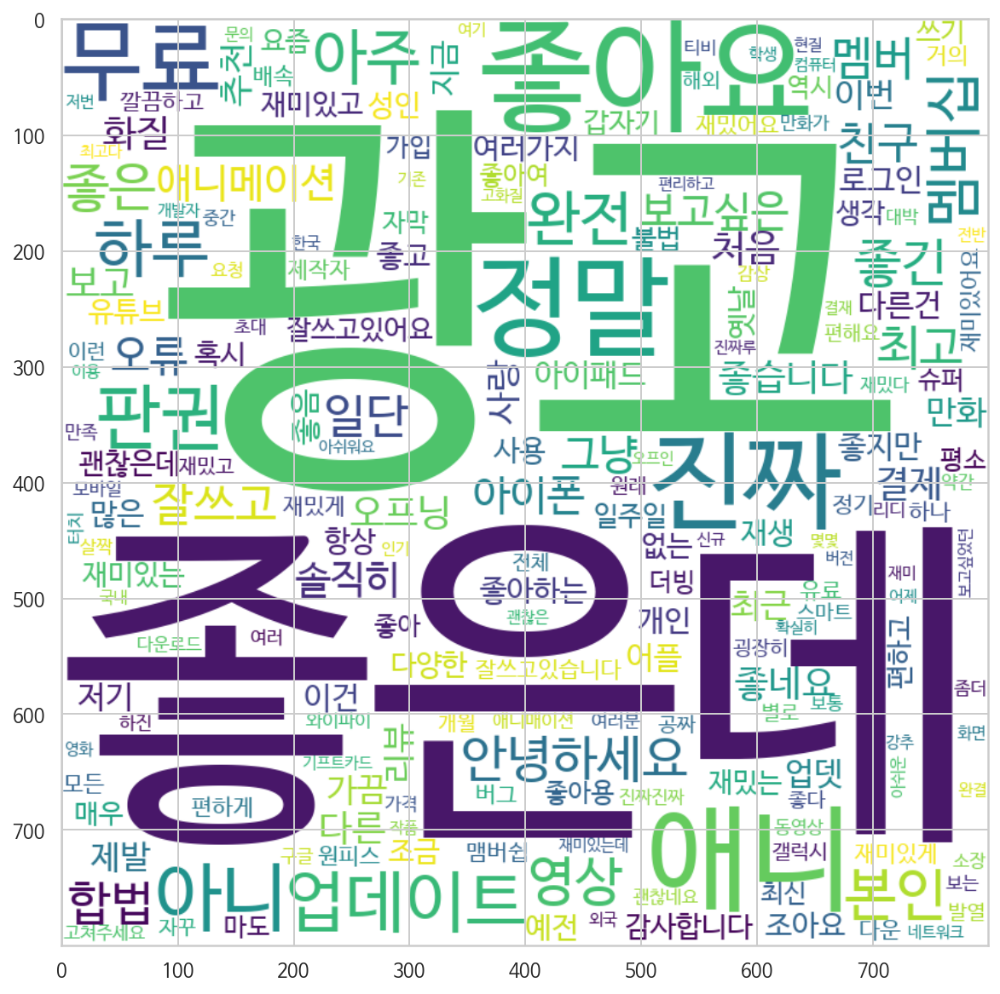

In [45]:
count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")

In [46]:
target = data.loc[data['review_date_year'] == 2019]
id_list2 = target['index'].tolist()

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
split_list.value_counts().head(30)

광고       258
좋아요      173
애니       168
진짜       153
정말       127
좋은데      115
무료        87
합법        56
본인        46
좋은        45
일단        42
아니        42
완전        37
최고        35
아주        34
판권        29
애니메이션     28
멤버십       23
좋습니다      23
다른        22
사용        20
처음        19
하루        18
솔직히       18
화질        18
불법        18
이런        17
안녕하세요     17
업데이트      16
결제        16
dtype: int64

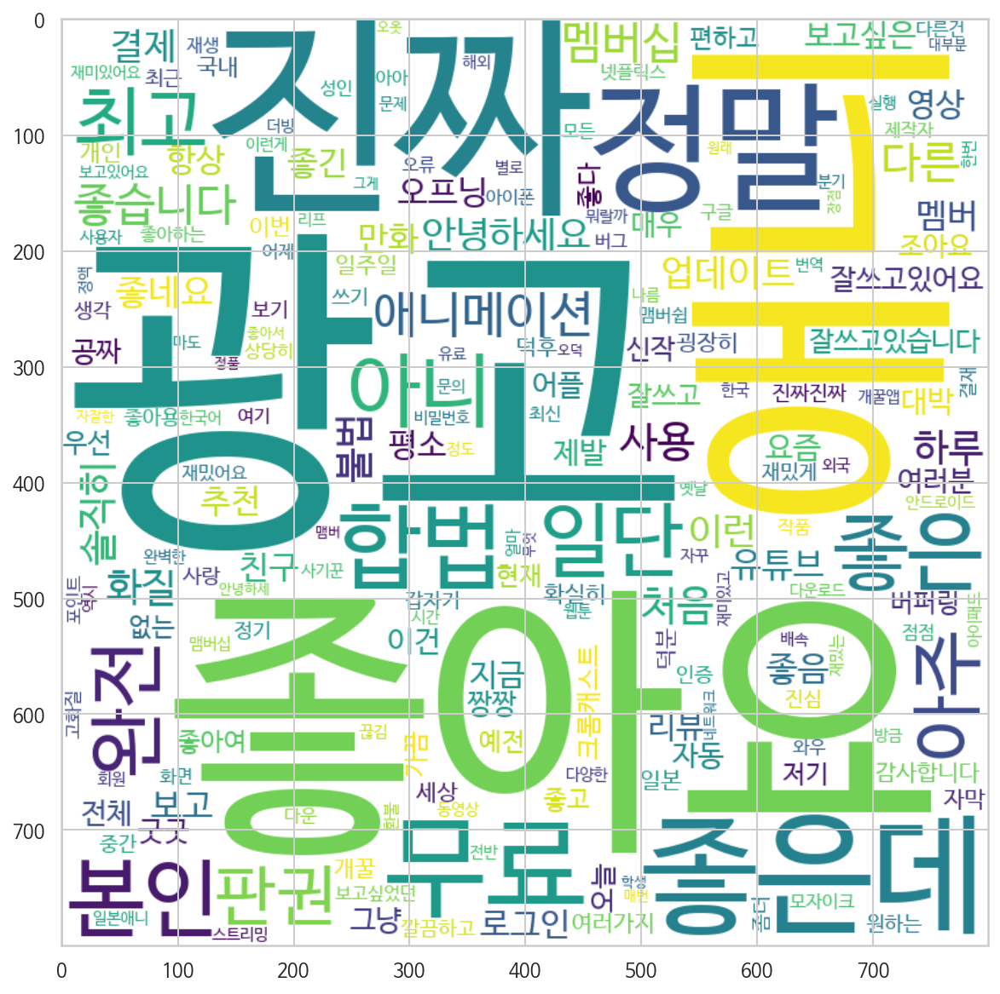

In [47]:
count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")

In [48]:
target = data.loc[data['review_date_year'] == 2018]
id_list2 = target['index'].tolist()

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
split_list.value_counts().head(30)

좋아요      44
애니       35
광고       34
진짜       34
합법       28
정말       24
좋은데      23
업데이트     17
본인       17
무료       16
아니       10
안녕하세요     9
최고        8
완전        8
처음        7
리뷰        7
일단        7
좋은        7
결제        7
좋습니다      7
불법        6
판권        5
다양한       5
아이폰       5
지금        5
이런        5
오류        5
영상        5
애니메이션     5
솔직히       5
dtype: int64

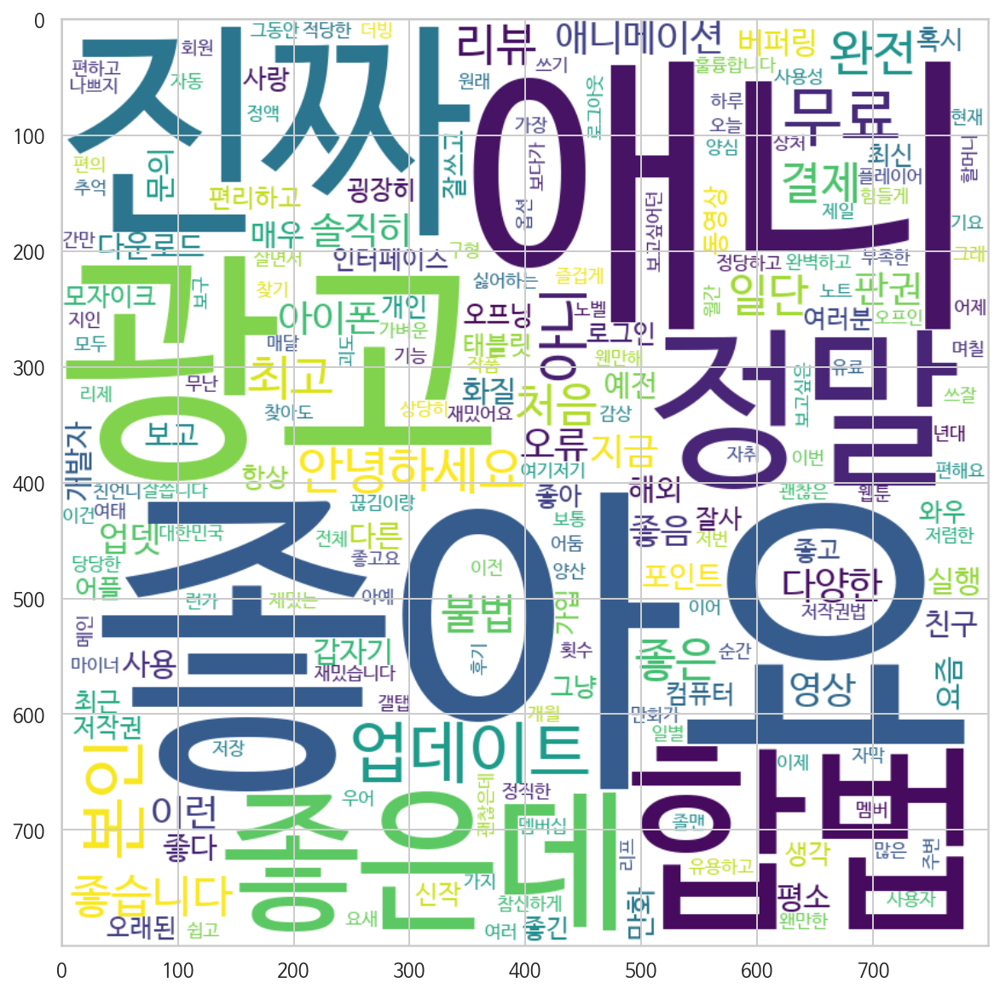

In [49]:
count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")

샘플 수 :  7974
좋아요      379
광고       363
애니       311
진짜       303
정말       286
좋은데      274
무료       127
합법       101
완전        82
좋은        77
판권        70
아주        70
최고        69
일단        66
애니메이션     48
좋습니다      42
안녕하세요     40
하루        38
처음        37
다른        36
멤버십       35
좋긴        34
오프닝       32
좋네요       32
친구        31
잘쓰고       30
업데이트      30
솔직히       29
사용        29
보고        29
dtype: int64


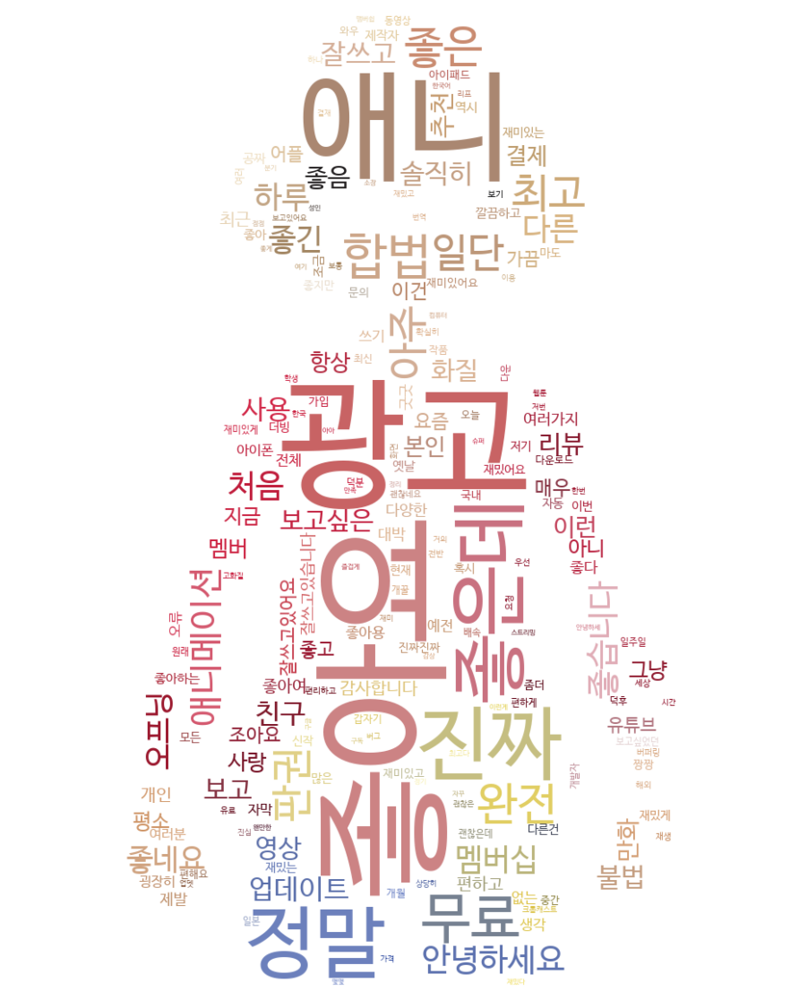

In [52]:
#twitter #형용사,동사추가
luffy_mask = np.array(Image.open("C:/Users/hp/Desktop/luffy.jpg"))
image_colors = ImageColorGenerator(luffy_mask)

target = data.loc[(data['평점'] == 5) | (data['평점'] == 4)]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))
split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wc_luffy = WordCloud(
    font_path = font_path,
    mask = luffy_mask,
    background_color = 'white'
)
wc_luffy = wc_luffy.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_luffy.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_twitter_review_5&4_luffy.png')


In [53]:
#평점별 단어빈도
target = data.loc[(data['평점'] == 5)]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))
split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
split_list.value_counts().head(30)

샘플 수 :  6068


좋아요      320
광고       270
진짜       270
애니       226
정말       214
좋은데      114
무료        99
합법        88
완전        74
최고        66
좋은        57
아주        56
일단        51
애니메이션     40
판권        38
좋습니다      34
처음        33
오프닝       30
좋네요       29
다른        28
불법        27
안녕하세요     26
친구        26
이런        25
추천        25
솔직히       24
좋음        23
멤버십       22
항상        22
사랑        22
dtype: int64

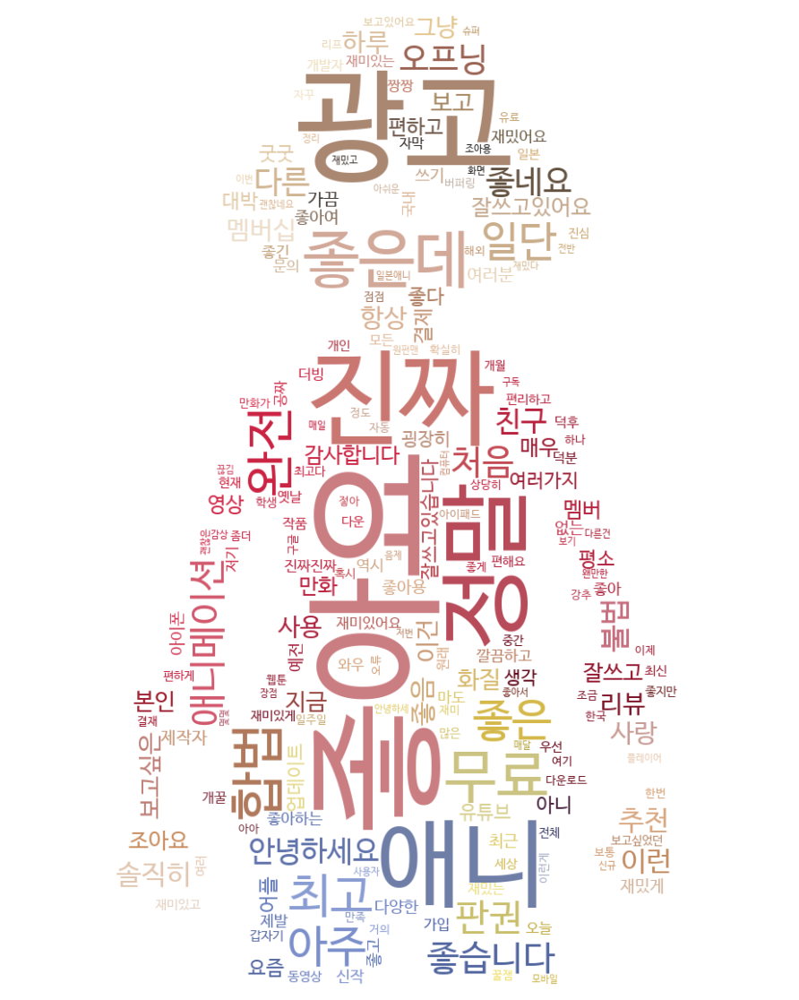

In [54]:
#twitter #형용사,동사추가
count = Counter(split_list)
wc_luffy = WordCloud(
    font_path = font_path,
    mask = luffy_mask,
    background_color = 'white'
)
wc_luffy = wc_luffy.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_luffy.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_twitter_review_5_luffy.png')


# count = Counter(split_list)
# wordcloud = wordcloud.generate_from_frequencies(count)
# array = wordcloud.to_array()

# %matplotlib inline
# import matplotlib.pyplot as plt

# fig = plt.figure(figsize=(10,10))
# plt.imshow(array, interpolation = "bilinear")

샘플 수 :  1906
좋은데      160
광고        93
애니        85
정말        72
좋아요       59
진짜        33
판권        32
무료        28
좋긴        25
좋은        20
업데이트      17
하루        16
일단        15
안녕하세요     14
아주        14
잘쓰고       13
멤버십       13
합법        13
영상        13
개인        10
사용        10
보고        10
만화         9
결제         9
보고싶은       9
화질         9
오류         9
전체         8
좋고         8
애니메이션      8
dtype: int64


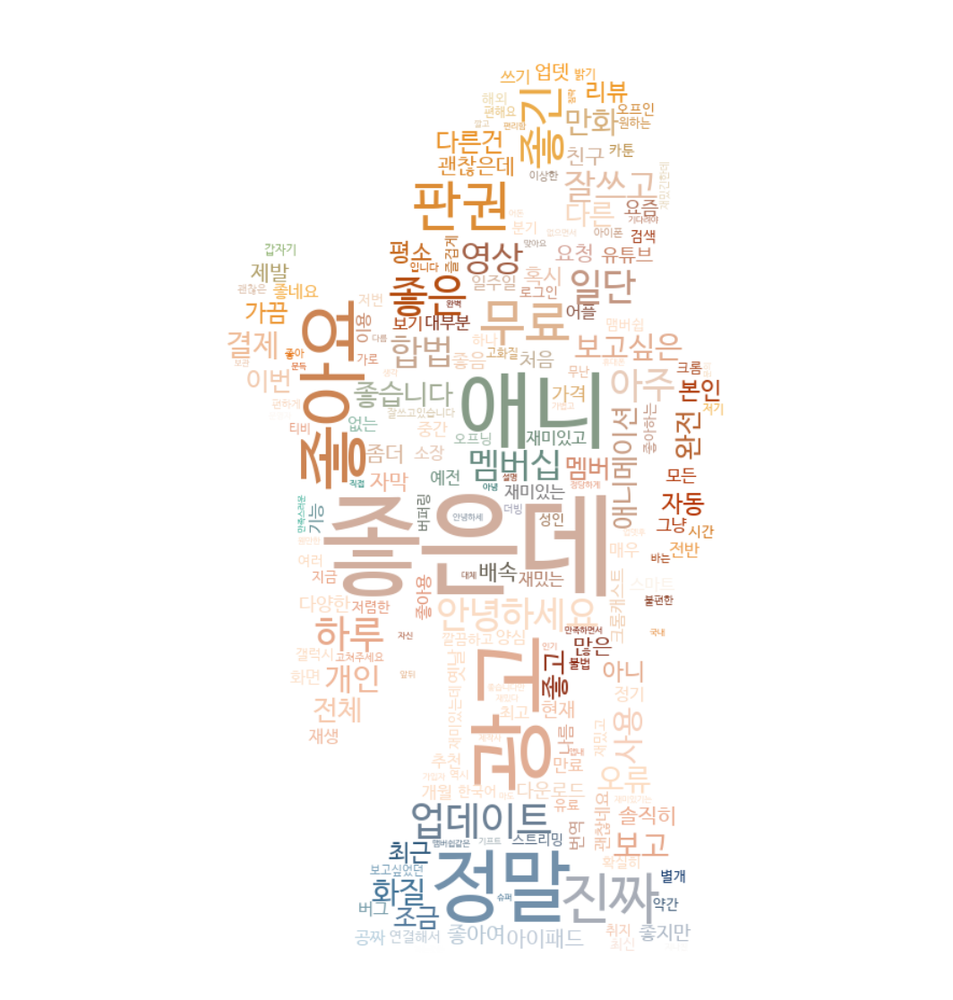

In [56]:
#평점별 단어빈도

nami_mask = np.array(Image.open("C:/Users/hp/Desktop/nami.jpg"))
image_colors = ImageColorGenerator(nami_mask)

target = data.loc[(data['평점'] == 4)]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))
split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wc_nami = WordCloud(
    font_path = font_path,
    mask = nami_mask,
    background_color = 'white'
)
wc_nami = wc_nami.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_nami.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_twitter_review_4_nami.png')

샘플 수 :  859
광고       61
좋은데      59
애니       25
본인       16
아니       16
무료       15
좋아요      15
판권       13
업데이트     12
멤버십      12
하루       11
좋긴        9
진짜        9
안녕하세요     9
오류        7
멤버        7
정말        6
화질        6
제발        6
지금        5
영상        5
합법        5
로그인       4
아이폰       4
결제        4
갑자기       4
다른        4
일주일       4
크롬캐스트     4
네트워크      3
dtype: int64


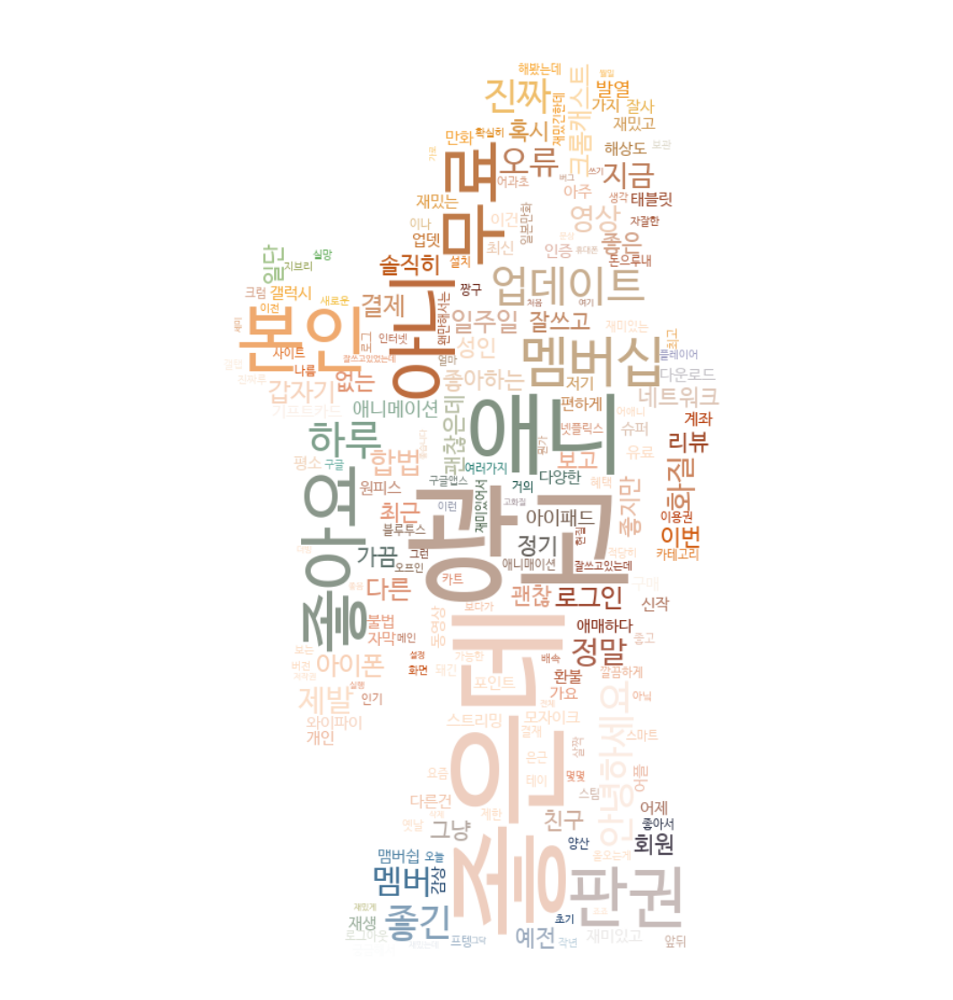

In [58]:
#평점별 단어빈도

nami_mask = np.array(Image.open("C:/Users/hp/Desktop/nami.jpg"))
image_colors = ImageColorGenerator(nami_mask)

target = data.loc[(data['평점'] == 3)]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))
split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wc_nami = WordCloud(
    font_path = font_path,
    mask = nami_mask,
    background_color = 'white'
)
wc_nami = wc_nami.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_nami.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_twitter_review_3_nami.png')

샘플 수 :  859
광고       61
좋은데      59
애니       25
본인       16
아니       16
무료       15
좋아요      15
판권       13
업데이트     12
멤버십      12
하루       11
좋긴        9
진짜        9
안녕하세요     9
오류        7
멤버        7
정말        6
화질        6
제발        6
지금        5
영상        5
합법        5
로그인       4
아이폰       4
결제        4
갑자기       4
다른        4
일주일       4
크롬캐스트     4
네트워크      3
dtype: int64


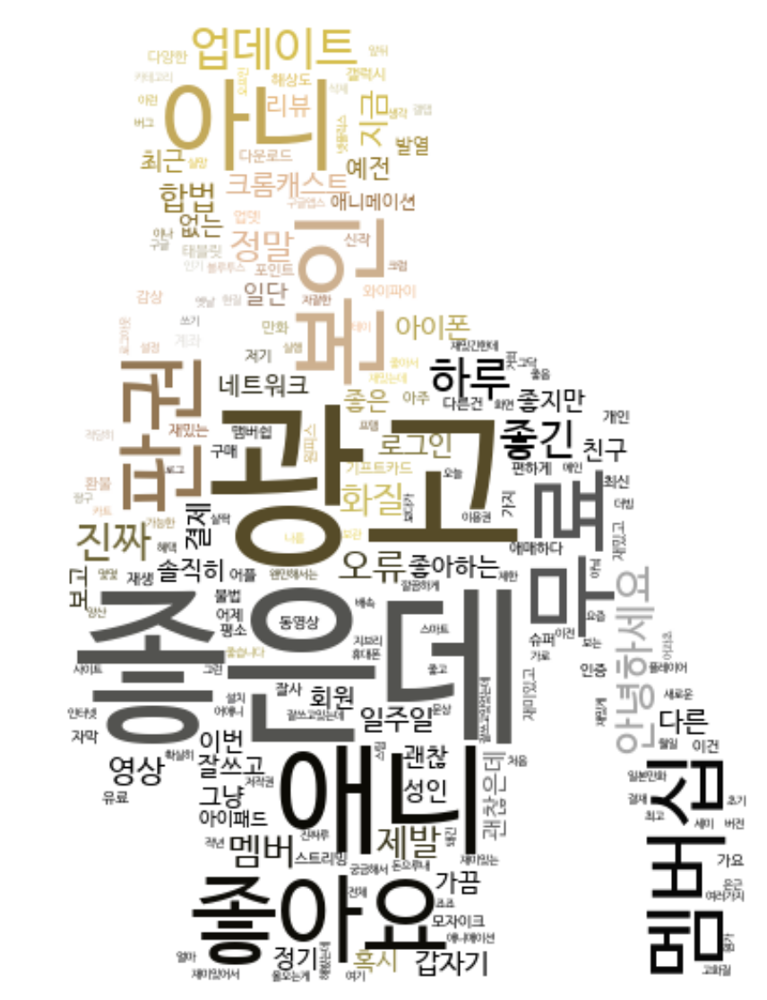

In [59]:
#평점별 단어빈도
sanji_mask = np.array(Image.open("C:/Users/hp/Desktop/sanji.jpg"))
image_colors = ImageColorGenerator(sanji_mask)

target = data.loc[(data['평점'] == 3)]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wc_sanji = WordCloud(
    font_path = font_path,
    mask = sanji_mask,
    background_color = 'white'
)
wc_sanji = wc_sanji.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_sanji.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_twitter_review_3_sanji.png')

샘플 수 :  387
광고       25
좋은데      16
무료       15
업데이트     15
아니       12
애니       11
본인        9
업뎃        7
멤버십       7
로그인       6
멤버        5
결제        5
안녕하세요     4
영상        4
일주일       3
좋아요       3
솔직히       3
진짜        3
갑자기       3
친구        3
정기        3
예전        3
처음        3
오류        3
이번        3
아이폰       2
보고싶은      2
정말        2
최신        2
보려고       2
dtype: int64


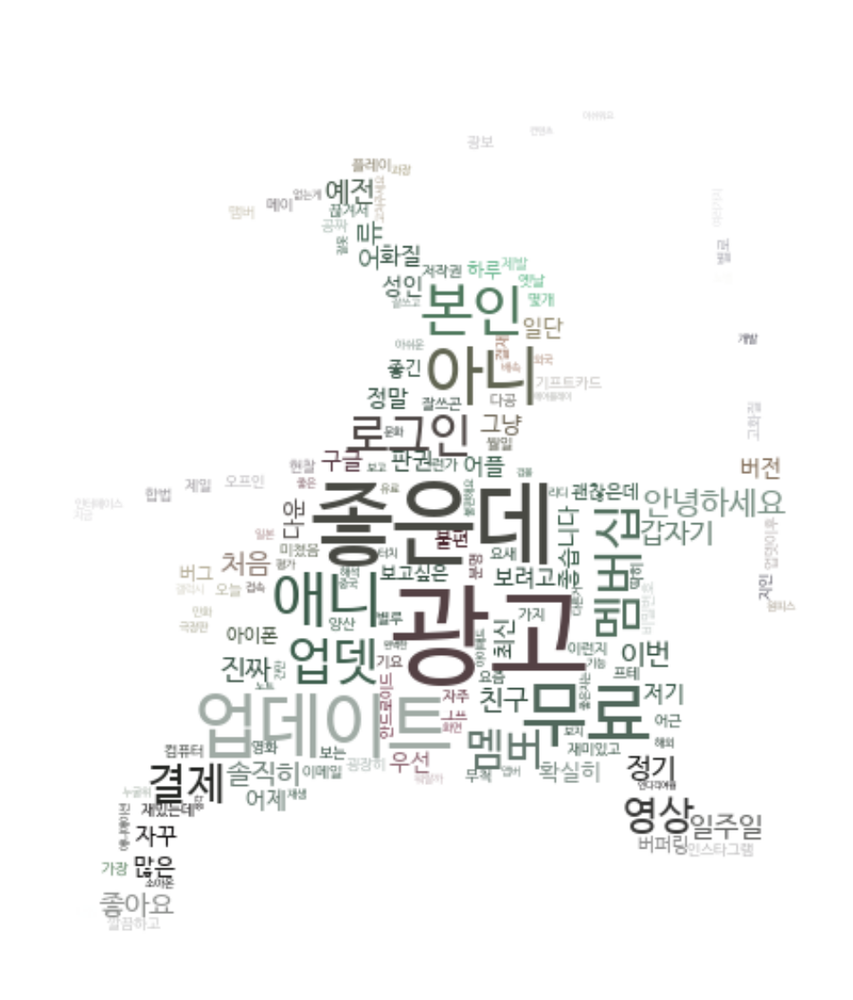

In [60]:
#평점별 단어빈도
zoro_mask = np.array(Image.open("C:/Users/hp/Desktop/zoro.jpg"))
image_colors = ImageColorGenerator(zoro_mask)

target = data.loc[(data['평점'] == 2)]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wc_zoro = WordCloud(
    font_path = font_path,
    mask = zoro_mask,
    background_color = 'white'
)
wc_sanji = wc_zoro.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_zoro.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_twitter_review_2_zoro.png')

In [61]:
#평점별 단어빈도
zoro_mask = np.array(Image.open("C:/Users/hp/Desktop/chopa.jpg"))
image_colors = ImageColorGenerator(zoro_mask)

target = data.loc[(data['star_point'] == 1)]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wc_zoro = WordCloud(
    font_path = font_path,
    mask = zoro_mask,
    background_color = 'white'
)
wc_sanji = wc_zoro.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_zoro.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_twitter_review_1_chopa.png')

KeyError: 'star_point'

In [ ]:
#평점별 단어빈도
zoro_mask = np.array(Image.open("C:/Users/hp/Desktop/chopa.jpg"))
image_colors = ImageColorGenerator(zoro_mask)

target = data.loc[(data['평점'] == 1) | (data['평점'] == 2)]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wc_zoro = WordCloud(
    font_path = font_path,
    mask = zoro_mask,
    background_color = 'white'
)
wc_sanji = wc_zoro.generate_from_frequencies(count)
fig = plt.figure(figsize = (10,10))
plt.imshow(wc_zoro.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_twitter_review_1&2_chopa.png')

In [ ]:
#연도+평점별 단어빈도

샘플 수 :  3621
좋아요      169
좋은데      166
광고       153
정말       137
애니       131
진짜       123
무료        56
판권        41
완전        37
아주        35
좋은        29
최고        25
하루        24
합법        24
좋긴        23
잘쓰고       21
일단        20
멤버십       20
보고싶은      19
친구        19
영상        18
업데이트      17
오프닝       17
애니메이션     17
안녕하세요     17
좋네요       16
좋습니다      15
추천        15
사랑        15
보고        14
dtype: int64


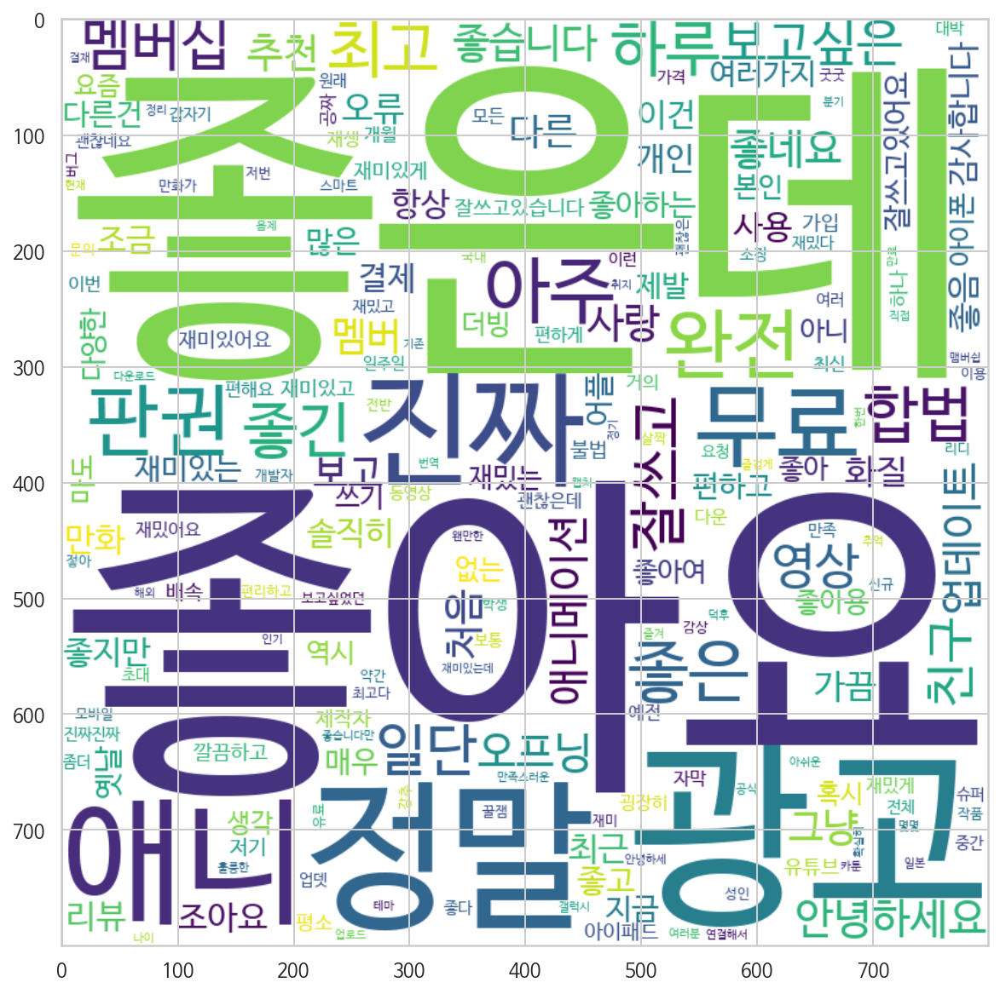

In [62]:
#평점별 단어빈도
target = data.loc[(data['review_date_year'] == 2020) & ((data['평점'] == 5) | (data['평점'] == 4))]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_2020&5-4.png')

샘플 수 :  502
좋은데      35
광고       27
애니       16
아니       13
멤버십      10
판권        9
안녕하세요     8
하루        8
좋아요       8
업데이트      8
진짜        7
무료        6
좋긴        6
멤버        5
정말        4
제발        4
오류        4
아이폰       4
본인        4
영상        3
아이패드      3
일단        3
발열        3
이번        3
혹시        3
예전        3
화질        3
그냥        3
솔직히       2
다운로드      2
dtype: int64


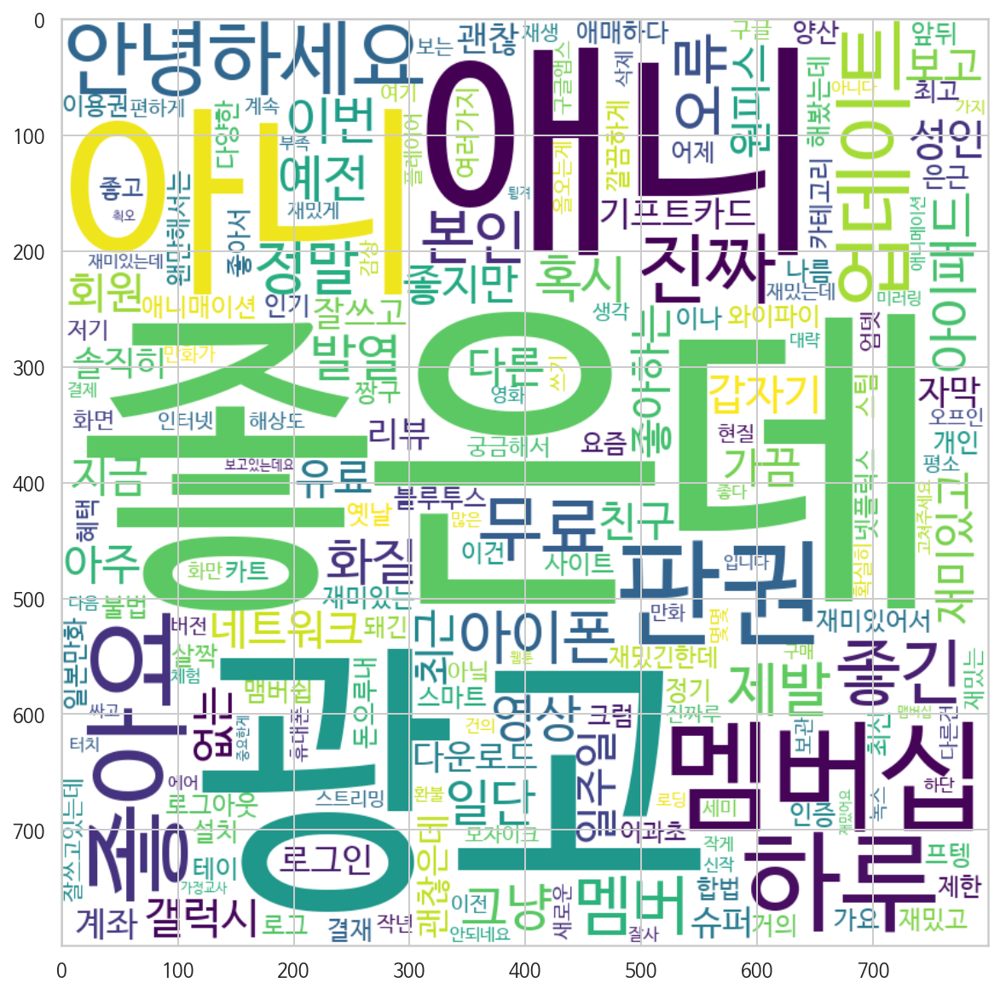

In [63]:
target = data.loc[(data['review_date_year'] == 2020) & ((data['평점'] == 3))]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_2020&3.png')

샘플 수 :  664
아니       41
광고       35
무료       27
업데이트     25
본인       24
애니       14
좋은데      12
하루       12
영상       10
아이폰       9
로그인       8
업뎃        7
솔직히       7
결제        7
진짜        6
오류        6
판권        6
멤버십       6
성인        5
멤버        5
이번        5
저기        4
재생        4
별로        4
그냥        4
자꾸        4
정기        3
갑자기       3
안녕하세요     3
버그        3
dtype: int64


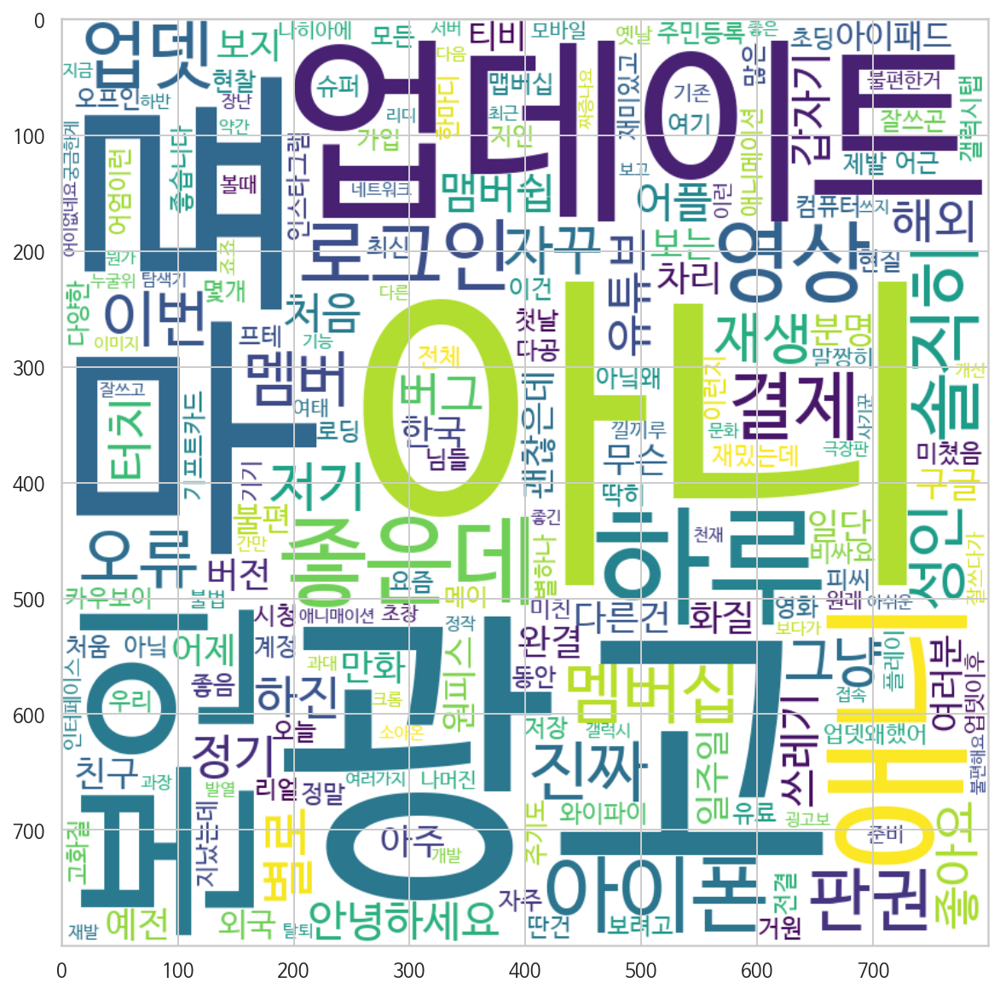

In [64]:
target = data.loc[(data['review_date_year'] == 2020) & ((data['평점'] == 2) | (data['평점'] == 1))]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_2020&2-1.png')

샘플 수 :  3567
광고       181
좋아요      166
진짜       147
애니       146
정말       125
좋은데       93
무료        55
합법        51
좋은        41
일단        40
완전        37
최고        35
아주        34
애니메이션     26
판권        24
좋습니다      21
다른        20
불법        17
사용        17
처음        17
이런        16
안녕하세요     16
멤버십       15
좋네요       15
솔직히       15
본인        14
화질        14
오프닝       13
하루        13
좋음        13
dtype: int64


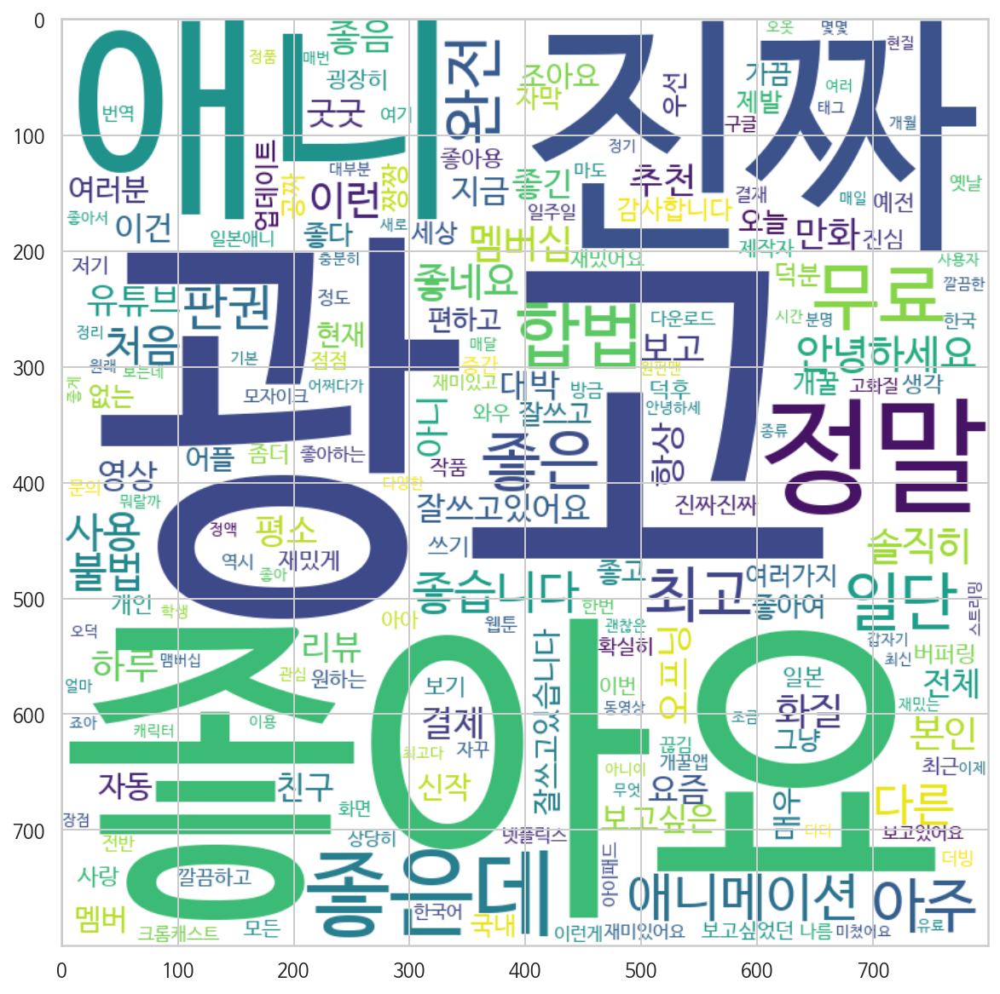

In [65]:
target = data.loc[(data['review_date_year'] == 2019) & ((data['평점'] == 5) | (data['평점'] == 4))]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_2019&5-4.png')

샘플 수 :  290
광고       31
좋은데      18
무료        9
애니        8
본인        7
좋아요       7
크롬캐스트     4
판권        4
화질        3
합법        3
하루        3
좋은        3
일주일       2
멤버십       2
어플        2
진짜        2
정기        2
갑자기       2
멤버        2
포인트       2
애니메이션     2
오류        2
다른        2
좋긴        2
제발        2
로그인       2
네트워크      1
별루엿다      1
당장        1
좋음        1
dtype: int64


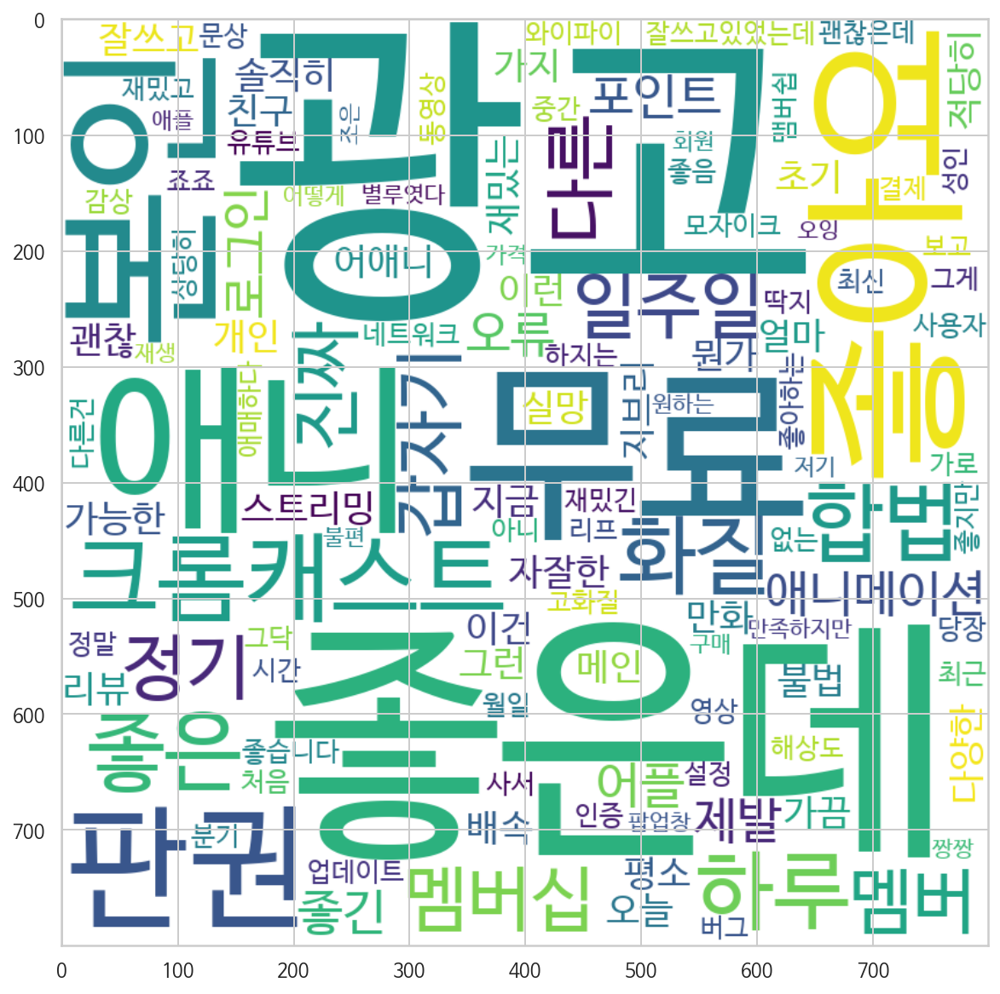

In [66]:
target = data.loc[(data['review_date_year'] == 2019) & ((data['평점'] == 3))]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_2019&3.png')

샘플 수 :  456
광고      46
아니      30
본인      25
무료      23
애니      14
로그인     10
업데이트     9
멤버십      6
멤버       4
좋은데      4
진짜       4
어제       3
인증       3
친구       3
실행       3
아이폰      3
별로       3
결제       3
사기꾼      3
그냥       3
사용       3
다운       3
확실히      2
성인       2
보고싶은     2
외국       2
포인트      2
장난       2
버퍼링      2
유튜브      2
dtype: int64


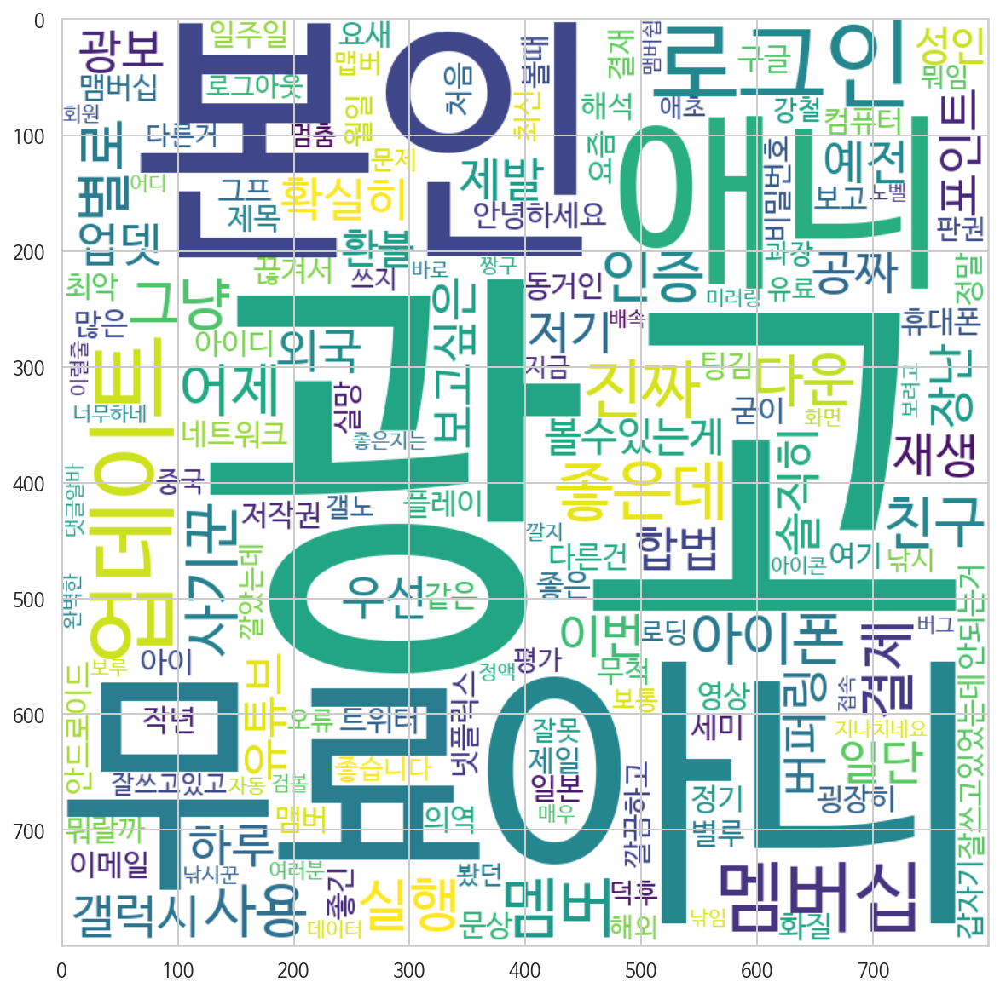

In [67]:
target = data.loc[(data['review_date_year'] == 2019) & ((data['평점'] == 2) | (data['평점'] == 1))]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_2019&2-1.png')

샘플 수 :  778
좋아요      44
애니       34
진짜       33
광고       29
합법       26
정말       23
무료       16
좋은데      15
최고        8
완전        8
좋은        7
리뷰        7
안녕하세요     7
업데이트      7
일단        6
처음        6
좋습니다      6
불법        6
판권        5
다양한       5
이런        5
애니메이션     5
솔직히       5
아이폰       4
좋음        4
문의        3
친구        3
보고        3
결제        3
좋다        3
dtype: int64


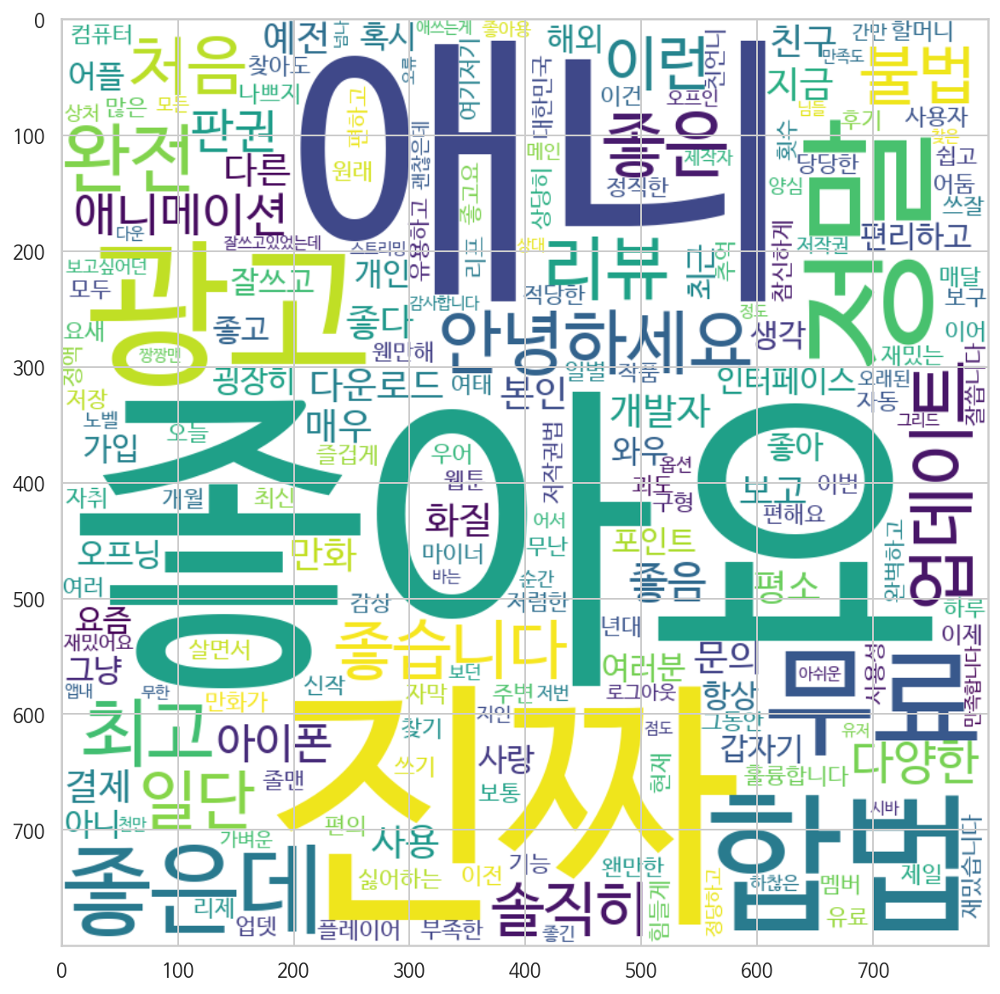

In [68]:
target = data.loc[(data['review_date_year'] == 2018) & ((data['평점'] == 5) | (data['평점'] == 4))]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_2018&5-4.png')

샘플 수 :  65
좋은데      6
본인       5
광고       3
업데이트     3
지금       2
아니       2
결제       2
태블릿      2
잘사       1
신작       1
저작권      1
안드로이드    1
애니       1
전체       1
괜찮은      1
갤탭       1
정말       1
동영상      1
합법       1
편하게      1
오류       1
영상       1
좋긴       1
실행       1
환불       1
죄송해요     1
오래된      1
사실       1
긴급       1
더빙       1
dtype: int64


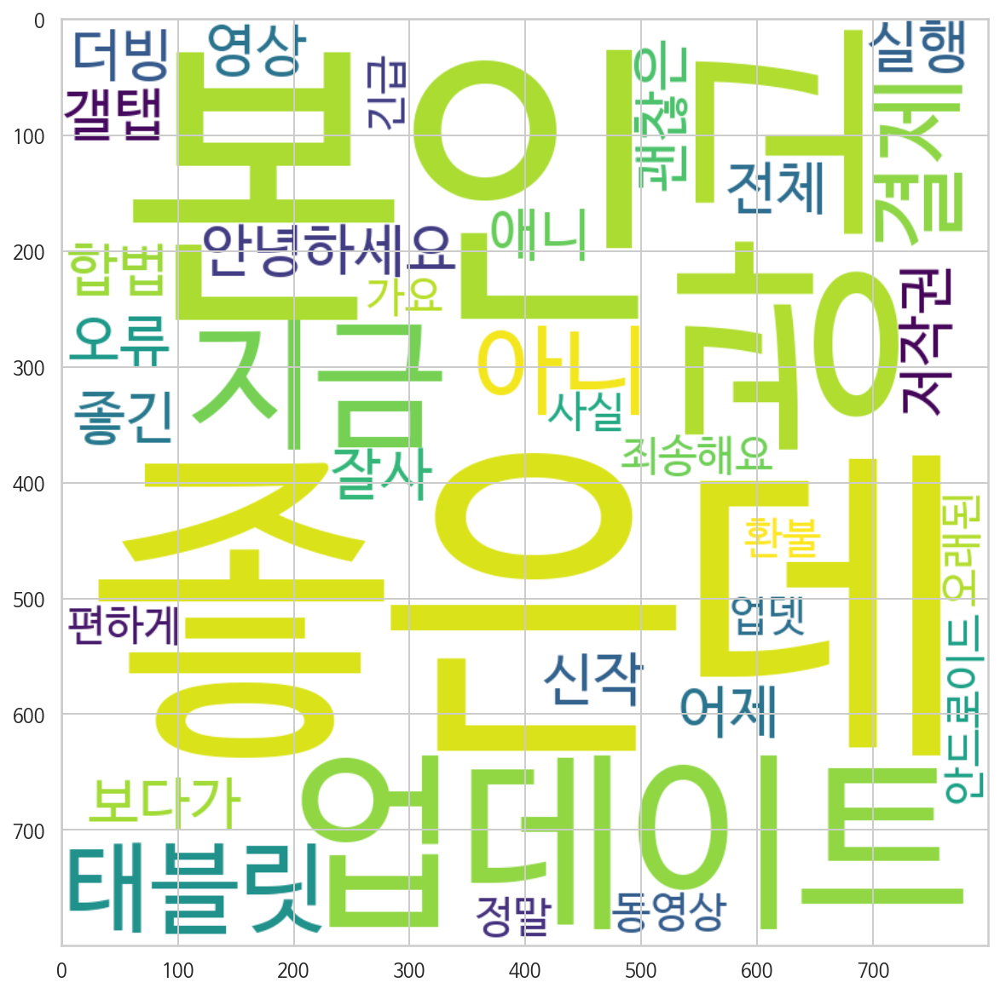

In [69]:
target = data.loc[(data['review_date_year'] == 2018) & ((data['평점'] == 3))]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_2018&3.png')

샘플 수 :  105
본인       9
업데이트     7
아니       6
영상       4
버퍼링      3
오류       3
업뎃       2
실행       2
결제       2
좋은데      2
모자이크     2
광고       2
로그인      2
아예       1
최신       1
그래       1
되다가      1
며칠       1
응답       1
터치       1
재생       1
보고싶은     1
진짜       1
일단       1
컨텐츠      1
짜증나네요    1
좋습니다     1
합법       1
별로       1
가장       1
dtype: int64


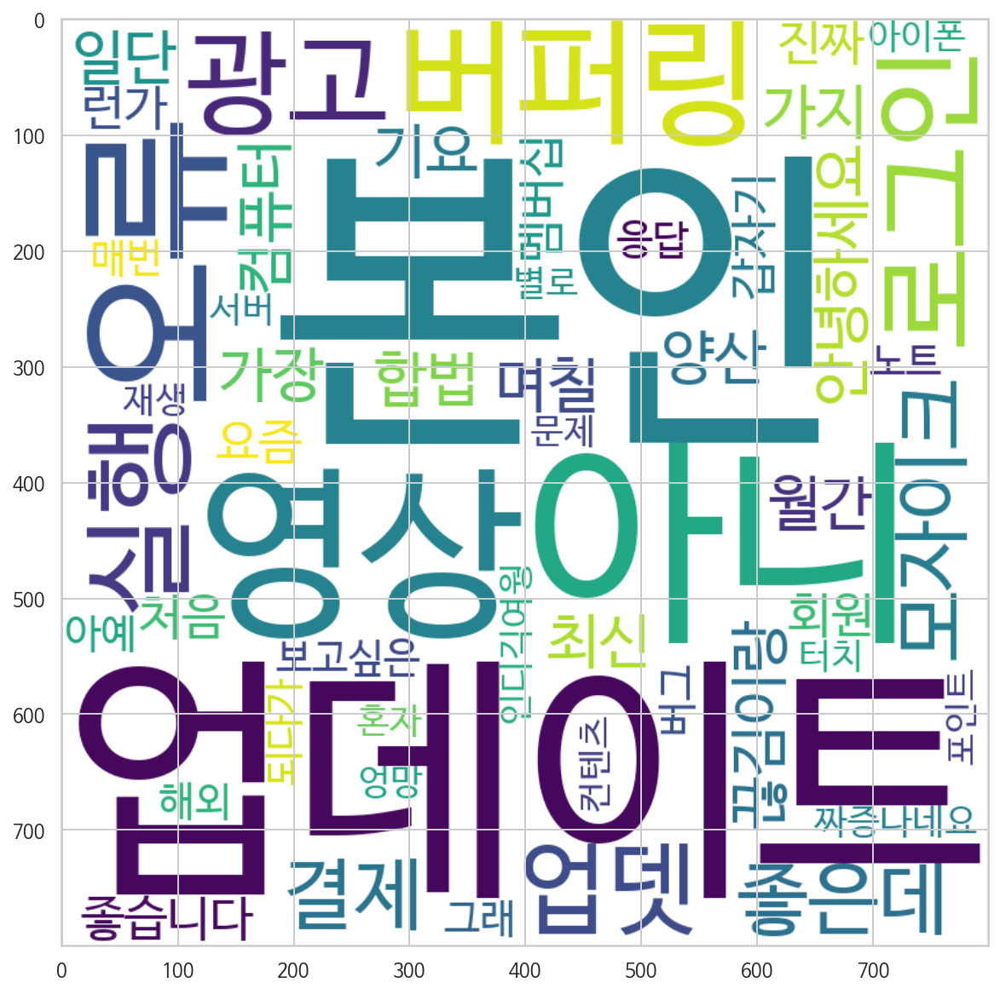

In [70]:
target = data.loc[(data['review_date_year'] == 2018) & ((data['평점'] == 2) | (data['평점'] == 1))]
id_list2 = target['index'].tolist()
print('샘플 수 : ', len(id_list2))

split_list = []
for i in id_list : 
    try:
        review_nouns_list = target.loc[target['index'] == i]['review_flatten_nouns(twitter)'].tolist()[0].split(',')
        for num in (0, len(review_nouns_list)) :
            split_list.append(review_nouns_list[num])
    except :
        pass
    
split_list = pd.Series([x for x in split_list if len(x)>1])
print(split_list.value_counts().head(30))

count = Counter(split_list)
wordcloud = wordcloud.generate_from_frequencies(count)
array = wordcloud.to_array()

%matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))
plt.imshow(array, interpolation = "bilinear")
# fig.savefig('wordcloud_twitter_2018&2-1.png')